In [ ]:
import gzip
from collections import defaultdict
import math
import scipy.optimize
import numpy as np
import string
from sklearn import linear_model
from tqdm.notebook import tqdm
import scipy.optimize as opt
import random
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
%matplotlib inline

In [ ]:
def assertFloat(x):
    assert type(float(x)) == float

def assertFloatList(items, N):
    assert len(items) == N
    assert [type(float(x)) for x in items] == [float]*N

In [ ]:
def readGz(path):
    for l in gzip.open(path, 'rt'):
        yield eval(l)

def readCSV(path):
    f = gzip.open(path, 'rt')
    f.readline()
    for l in f:
        u,b,r = l.strip().split(',')
        r = int(r)
        yield u,b,r

# Dataset

## Importing Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
gpath = "/content/drive/MyDrive/258/Ass2/Drugs/"
# gpath = ""

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/258/Ass2/Drugs/"archive (1).zip"

Archive:  /content/drive/MyDrive/258/Ass2/Drugs/archive (1).zip
  inflating: steam_reviews.csv       


## Preprocessing

In [ ]:
!pip install html2text

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### The raw dataset which we are using from kaggle had been scraped from the steam store and hence is not perfect from a programming perspective. The following are the base preprocessing we did per column:

* Date posted on: Converted the given date into a comparable datatype using the datetime library.
* How many people found it Funny, Helpful and the Hours played by the reviwer converted to float.
* Is early access converted to 0/1
* Did the user Recommend the game or not converted to 0/1
* text preprocessing for the review text and the game name using:
  1. Using the html2text library to remove basic html tags and hyperlinks
  2. Remove all special escape sequences and greater than symbols from the text using string.translate()

NOTE: We further will preprocess this data depending on the model we are planning to use

In [ ]:
import csv
from datetime import datetime
import html2text
rows = []
with open("steam_reviews.csv", 'r') as file:
    csvreader = csv.reader(file)
    header = next(csvreader)
    for row in csvreader:
        rows.append(row)
print(header)
dataset = []
tmp = list(range(1,32)) # asscii of all the special escape sequences to filter them in preprocessing
tmp.extend([60,62])
filter = ''.join([chr(i) for i in tmp]) # filter to do the abv

for i in rows:
  tmp = {}
  tmp["date"] = datetime.strptime(i[0],"%Y-%m-%d")
  tmp["funny"] = float(i[1])
  tmp["helpful"] = float(i[2])
  tmp["hrs"] = float(i[3])
  if i[5].lower() == "true":
    tmp["beta"] = 1
  else:
    tmp["beta"] = 0
  if i[5] == "Recommended":
    tmp["rec"] = 1
  else:
    tmp["rec"] = 0
  
  h = html2text.HTML2Text()
  h.ignore_links = True
  tmp["review"] = h.handle(i[6]).translate(str.maketrans('', '', filter))
  tmp["game"] = h.handle(i[7]).translate(str.maketrans('', '', filter))
  dataset.append(tmp)


['date_posted', 'funny', 'helpful', 'hour_played', 'is_early_access_review', 'recommendation', 'review', 'title']


In [ ]:
dataset[0]

{'date': datetime.datetime(2019, 2, 10, 0, 0),
 'funny': 2.0,
 'helpful': 4.0,
 'hrs': 578.0,
 'beta': 0,
 'rec': 1,
 'review': " Played as German Reich Declare war on Belgium Can't break Belgium so go through France Capitulate France in order to get to Belgium Get True Blitzkrieg achievementThis game is dad",
 'game': 'Expansion - Hearts of Iron IV: Man the Guns'}

In [ ]:
len(dataset)

434891

## Adding genres manually

Our data didn't came with the genre of the games so we manually scraped steam to get the genres depending on the game.



In [ ]:
allGames = set()
for i in dataset:
  allGames.add(i["game"])

In [ ]:
len(allGames)

48

In [ ]:
print(allGames)

{'Warhammer 40,000: Mechanicus', 'Euro Truck Simulator 2', 'Factorio', 'Wargroove', "Don't Starve Together", 'Kenshi', 'Overcooked! 2', "PLAYERUNKNOWN'S BATTLEGROUNDS", 'Insurgency: Sandstorm', 'GOD EATER 3', 'ACE COMBAT™ 7: SKIES UNKNOWN', 'Football Manager 2019', 'Human: Fall Flat', 'RimWorld', 'Foundation', 'Beat Saber', 'Rocket League®', "Tom Clancy's Rainbow Six® Siege", 'ASTRONEER', 'Subnautica: Below Zero', 'My Time At Portia', 'Expansion - Hearts of Iron IV: Man the Guns', 'Wallpaper Engine', 'RESIDENT EVIL 2 / BIOHAZARD RE:2', "Garry's Mod", 'Slay the Spire', 'Left 4 Dead 2', 'Divinity: Original Sin 2 - Definitive Edition', 'Sid Meier’s Civilization® VI: Rise and Fall', 'Farming Simulator 19', 'Battlefleet Gothic: Armada 2', 'Pathfinder: Kingmaker', 'Terraria', 'The Elder Scrolls V: Skyrim Special Edition', 'MONSTER HUNTER: WORLD', 'Cold Waters', 'Moonlighter', 'NBA 2K19', 'Dead by Daylight', 'Rust', 'Subnautica', 'Tannenberg', 'Stardew Valley', 'Sid Meier’s Civilization® VI',

In [ ]:
dick = {}
dick["RimWorld"] = ["Strategy","Simulation","Indie"]
dick["Subnautica: Below Zero"] = ["Adventure","Indie"]
dick["Rust"] = ["Survival","MMO","RPG","Indie","Action","Adventure"]
dick["Foundation"] = ["Strategy","Indie","Simulation"]
dick["Sid Meier’s Civilization® VI"] = ["Strategy"]
dick["NBA 2K19"] = ["Sports","Simulation"]
dick["Tom Clancy's Rainbow Six® Siege"] = ["Action"]
dick["Cold Waters"] = ["Strategy","Indie","Simulation"]
dick["Beat Saber"] = ["Exercise","Rythm","Indie"]
dick["Left 4 Dead 2"] = ["Action","Survival"]
dick["RESIDENT EVIL 2 / BIOHAZARD RE:2"] = ["Action"]
dick["GOD EATER 3"] = ["Action"]
dick["Subnautica"] = ["Adventure","Indie"]
dick["Battlefleet Gothic: Armada 2"] = ["Strategy"]
dick["Warhammer 40,000: Mechanicus"] = ["Action","Adventure","Indie"]
dick["MONSTER HUNTER: WORLD"] = ["Action"]
dick["Survivor Pass: Vikendi"] = ["Survival","Action","MMO","Adventure"]
dick["Tannenberg"] = ["Action","Adventure","Indie"]
dick["Football Manager 2019"] = ["Sports","Simulation"]
dick["Euro Truck Simulator 2"] = ["Simulation","Indie"]
dick["Wallpaper Engine"] = ["Animation","Modelling","Design","Indie"]
dick["Don't Starve Together"] = ["Adventure","Indie","Simulation"]
dick["ACE COMBAT™ 7: SKIES UNKNOWN"] = ["Action","Simulation"]
dick["Expansion - Hearts of Iron IV: Man the Guns"] = ["Strategy","Simulation"]
dick["Divinity: Original Sin 2 - Definitive Edition"] = ["RPG","Adventure","Strategy"]
dick["Factorio"] = ["Strategy","Indie","Simulation","Casual"]
dick["Human: Fall Flat"] = ["Adventure","Indie","Simulation","Casual"]
dick["Pathfinder: Kingmaker"] = ["RPG"]
dick["ASTRONEER"] = ["Adventure","Indie"]
dick["My Time At Portia"] = ["Adventure","Casual","Indie","RPG","Simulation"]
dick["Sid Meier’s Civilization® VI: Rise and Fall"] = ["Strategy"]
dick["ARK: Survival Evolved"] = ["Survival","Action","MMO","RPG","Indie","Adventure"]
dick["Sid Meier's Civilization® VI: Gathering Storm"] = ["Strategy"]
dick["Dead by Daylight"] = ["Survival","Action"]
dick["Kenshi"] = ["Action","Indie","Simulation","Strategy","RPG"]
dick["Overcooked! 2"] = ["Simulation","Cooking","Casual","Indie"]
dick["Terraria"] = ["Adventure","Action","Indie","RPG"]
dick["Grand Theft Auto V"] = ["Action","MMO","Adventure"]
dick["Stardew Valley"] = ["Adventure","Indie","RPG","Simulation"]
dick["Wargroove"] = ["Strategy","Indie"]
dick["Farming Simulator 19"] = ["Simulation"]
dick["PLAYERUNKNOWN'S BATTLEGROUNDS"] = ["Survival","Action","MMO","RPG","Indie","Adventure"]
dick["Moonlighter"] = ["Adventure","Action","Indie"]
dick["Garry's Mod"] = ["Indie","Simulation","Casual"]
dick["The Elder Scrolls V: Skyrim Special Edition"] = ["RPG"]
dick["Slay the Spire"] = ["Strategy","Indie"]
dick["Insurgency: Sandstorm"] = ["Action"]
dick["Rocket League®"] = ["Sports"]

### We ended up adding 16 unique genres to our dataset, We will further visualize the distribution later

In [ ]:
allGenre = set()
for game in dick:
  allGenre.update(dick[game])
print(allGenre)
print(len(allGenre))

{'Adventure', 'Action', 'Rythm', 'Indie', 'Survival', 'RPG', 'Exercise', 'Modelling', 'Animation', 'Simulation', 'Casual', 'Strategy', 'Cooking', 'Sports', 'MMO', 'Design'}
16


In [ ]:
for i in range(len(dataset)):
  dataset[i]["genre"] = dick[dataset[i]["game"]]

In [ ]:
dataset[0]

{'date': datetime.datetime(2019, 2, 10, 0, 0),
 'funny': 2.0,
 'helpful': 4.0,
 'hrs': 578.0,
 'beta': 0,
 'rec': 1,
 'review': " Played as German Reich Declare war on Belgium Can't break Belgium so go through France Capitulate France in order to get to Belgium Get True Blitzkrieg achievementThis game is dad",
 'game': 'Expansion - Hearts of Iron IV: Man the Guns',
 'genre': ['Strategy', 'Simulation']}

## Splitting the data into train and test

In [ ]:
# np.random.seed(69420)
# np.random.shuffle(dataset)

In [ ]:
# dataset[:1]

In [ ]:
# dataTrain = dataset[:103043]
# dataTest = dataset[103043:]

In [ ]:
# playersPerGame = defaultdict(set)
# gamePerPlayer = defaultdict(set)
# hrsDict = {}

# for i in dataTrain:
#   # if i[0] not in itemsPerUser:
#   #   itemsPerUser[i[0]] = [i[1]]
#   # else:
  
#   itemsPerUser[i[0]].add(((i[1],1)))
  
#   # if i[1] not in usersPerItem:
#   #   usersPerItem[i[1]] = [i[0]]
#   # else:
#   usersPerItem[i[1]].add((i[0],1))

#   ratingDict[(i[0],i[1])] = i[2]

#   # print(itemsPerUser)
  


# Exploratory Analysis

## Wordcloud per Game

In [ ]:
lis = ["bruh","bruhhh"]
" ".join(lis)

'bruh bruhhh'

### Creating Bag of words by using a multiple layers of text preprocessing:


*   Word Tokenization
*   All to Lower
* Removing Stop words
* Removing any special characters/ punctuations
* Converting words into root form using a lemmatizer



In [ ]:
# import nltk packages
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
nltk.download('stopwords')

from nltk import pos_tag
from nltk.corpus import wordnet 
nltk.download('wordnet')
from nltk.stem.wordnet import WordNetLemmatizer
nltk.download('averaged_perceptron_tagger')
nltk.download('omw-1.4')

def get_wordnet_pos(word): # To remove part of specches
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)

BOW = defaultdict(list)
for i in dataset:
  wordLis = word_tokenize(i["review"]) # Tokenizing the words
  wordLis = [w.lower() for w in wordLis] # Lowering everything
  wordLis = [w for w in wordLis if w not in stopwords.words('english')] # Removing stopwords
  wordLis = [w for w in wordLis if w.isalnum()] # Removing punctuation
  wordLis = [WordNetLemmatizer().lemmatize(w, get_wordnet_pos(w)) for w in wordLis]
  BOW[i["game"]].extend(wordLis)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
print(BOW["Rust"][:50])

['own', 'rust', 'maybe', '3', 'year', 'played', 'partenjoyed', 'get', 'wrong', 'rust', 'good', 'game', 'bp', 'systemsis', 'great', 'take', 'get', 'need', 'building', 'base', 'explore', 'occasional', 'firefight', 'isalso', 'fun', 'talk', 'start', '3', 'year', 'ago', 'game', 'look', 'good', 'runswell', 'frequent', 'update', '3', 'year', 'one', 'reason', 'would', 'notrecommend', 'game', 'due', 'community', 'far', 'bad', 'communityi', 'misfortune', 'experience']


### Wordcloud for single game

In [ ]:
# import wordcloud library
from wordcloud import WordCloud

# create a single string of space separated words
unique_string=(" ").join(BOW["Grand Theft Auto V"])

# create the word cloud and save to file
wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
wordcloud.to_file("word_cloud.png")

In [ ]:
import numpy as np
from PIL import Image

unique_string_v2=(" ").join(BOW["Grand Theft Auto V"])
cloud_mask = np.array(Image.open("gg22.png"))
wordcloud = WordCloud(width = 1000, height = 500, background_color="white",
               mask=cloud_mask, max_words=5000, contour_width=2, contour_color='black')
wordcloud.generate(unique_string_v2)
wordcloud.to_file("word_cloud_masked2.png")

In [ ]:
cloud_mask = np.array(Image.open("gg22.png"))

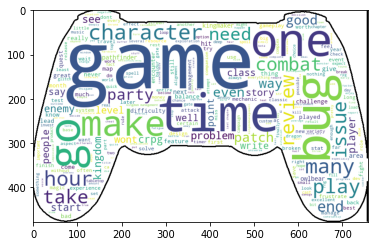

In [ ]:
plt.imshow(wordcloud.to_array())
plt.show()

### Wordclouds of all 48 games present in the dataset.

In [ ]:
# x = np.linspace(0, 2 * np.pi, 400)
# y = np.sin(x ** 2)
# fig, axs = plt.subplots(3, 4)
# fig.set_figheight(16.875)
# fig.set_figwidth(30)
# axs[0, 0].plot(x, y)
# axs[0, 0].set_title('Axis [0, 0]')
# axs[0, 1].plot(x, y, 'tab:orange')
# axs[0, 1].set_title('Axis [0, 1]')
# axs[1, 0].plot(x, -y, 'tab:green')
# axs[1, 0].set_title('Axis [1, 0]')
# axs[1, 1].plot(x, -y, 'tab:red')
# axs[1, 1].set_title('Axis [1, 1]')

# for ax in axs.flat:
#     ax.set(xlabel='x-label', ylabel='y-label')

# # Hide x labels and tick labels for top plots and y ticks for right plots.
# for ax in axs.flat:
#     ax.label_outer()

  0%|          | 0/48 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

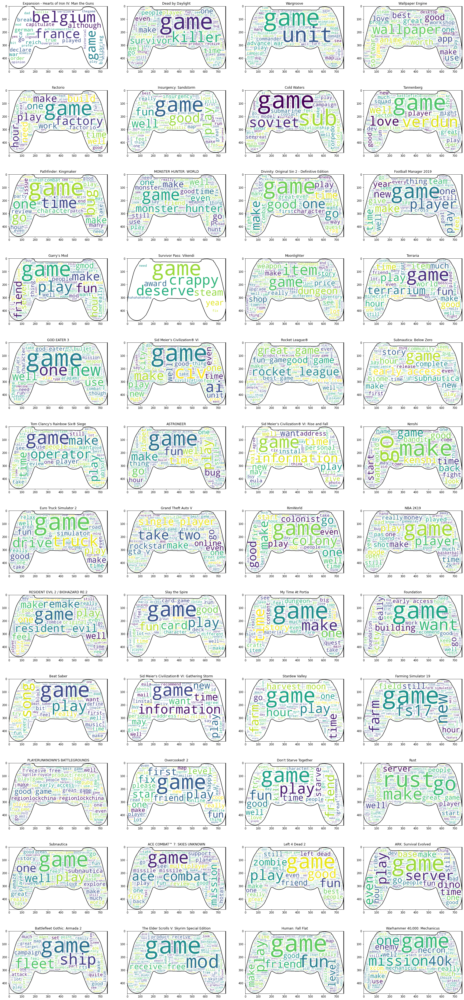

In [ ]:
from PIL import Image
from wordcloud import WordCloud
plt.figure()

#subplot(r,c) provide the no. of rows and columns
fig, axs = plt.subplots(12, 4) #12
fig.set_figheight(67.5)
fig.set_figwidth(30)

cnt = 0
games = list(BOW.keys())
for game in tqdm(range(len(games))):
  unique_string_v2=(" ").join(BOW[games[game]])
  cloud_mask = np.array(Image.open("gg22.png"))
  wordcloud = WordCloud(width = 1000, height = 500, background_color="white",
                mask=cloud_mask, max_words=5000, contour_width=2, contour_color='black')
  wordcloud.generate(unique_string_v2)


  # print(cnt%4,cnt%12)
  axs[cnt//4, cnt%4].imshow(wordcloud.to_array())
  axs[cnt//4, cnt%4].set_title(games[game])
  # axs[cnt//4, cnt%4].set_title("tmp")
  # plt.axis("off")
  cnt+=1
  
  # if cnt == 1:
  #   break

plt.show()

## We will do more exploratory analysis as we try and implement various types of models below

## Looking at the data we decided that our main focus will be on 
1. Whether the reviewer is trying to recommend the game or not and
2. Multiclass Genre prediction.

# Recommended or not prediction

## Let's start by the baseline models we knwo of: Baseline by top n games

In [ ]:
dataset[0]

{'date': datetime.datetime(2019, 2, 10, 0, 0),
 'funny': 2.0,
 'helpful': 4.0,
 'hrs': 578.0,
 'beta': 0,
 'rec': 1,
 'review': " Played as German Reich Declare war on Belgium Can't break Belgium so go through France Capitulate France in order to get to Belgium Get True Blitzkrieg achievementThis game is dad",
 'game': 'Expansion - Hearts of Iron IV: Man the Guns',
 'genre': ['Strategy', 'Simulation']}

In [ ]:
len(dataset)

434891

In [ ]:
baseline = dataset
np.random.seed(69420)
np.random.shuffle(baseline)

In [ ]:
trainData = baseline[:int(len(dataset)*.8)]
testData = baseline[int(len(dataset)*.8):]

In [ ]:
reviewCnt = defaultdict(int)

In [ ]:
for i in trainData:
  reviewCnt[i["game"]] +=1

In [ ]:
len(reviewCnt)

48

In [ ]:
allGamesSorted = dict(sorted(reviewCnt.items(),key=lambda item:item[1],reverse=True))

In [ ]:
print(allGamesSorted)

{"PLAYERUNKNOWN'S BATTLEGROUNDS": 116433, 'Grand Theft Auto V': 80115, 'Rust': 56878, 'Rocket League®': 54249, 'Dead by Daylight': 17801, 'MONSTER HUNTER: WORLD': 14739, 'ASTRONEER': 2152, 'The Elder Scrolls V: Skyrim Special Edition': 1187, 'RESIDENT EVIL 2 / BIOHAZARD RE:2': 1117, 'Sid Meier’s Civilization® VI': 414, 'Euro Truck Simulator 2': 378, 'Terraria': 205, 'Slay the Spire': 203, 'Subnautica': 199, 'Left 4 Dead 2': 187, 'RimWorld': 167, 'Stardew Valley': 164, 'Insurgency: Sandstorm': 164, 'ARK: Survival Evolved': 159, "Garry's Mod": 154, 'Divinity: Original Sin 2 - Definitive Edition': 147, 'Wallpaper Engine': 144, 'Factorio': 133, 'Human: Fall Flat': 132, "Don't Starve Together": 128, 'Foundation': 10, 'GOD EATER 3': 10, 'Pathfinder: Kingmaker': 9, 'Kenshi': 9, 'Battlefleet Gothic: Armada 2': 9, 'Beat Saber': 9, 'Warhammer 40,000: Mechanicus': 9, 'ACE COMBAT™ 7: SKIES UNKNOWN': 9, 'My Time At Portia': 8, 'NBA 2K19': 8, 'Football Manager 2019': 8, "Tom Clancy's Rainbow Six® Si

In [ ]:
cnt = 0
top1Per = set()
for i in allGamesSorted:
  top1Per.add(i)
  cnt+=allGamesSorted[i]
  if cnt>len(trainData)*0.9999:
    break
len(top1Per)

In [ ]:
corr = 0
for i in testData:
  if i["game"] in top1Per and i["rec"]==1:
    corr+=1
  elif i["game"] not in top1Per and i["rec"]==0:
    corr+=1

acc = corr/len(testData)*100
print("Baseline top1tier acc",acc)

Baseline top1tier acc 69.72717552512675


### We can see that the naive method of directly corelating the popularity of the game with recommendation like we did for READ/NOT READ is actually not bad, and is giving an accuracy of 69.7 %



### Baseline sentimental anal bag of words hw4 Ridge Regression

In [ ]:
import gzip
import math
import matplotlib.pyplot as plt
import numpy
import random
import sklearn
import string
from collections import defaultdict
from gensim.models import Word2Vec
from nltk.stem.porter import *
from sklearn import linear_model
from sklearn.manifold import TSNE

In [ ]:
baseline = dataset
np.random.seed(69420)
np.random.shuffle(baseline)

In [ ]:
trainData = baseline[:int(len(dataset)*.8)]
testData = baseline[int(len(dataset)*.8):]

No of unique words

In [ ]:
wordCount = defaultdict(int)
for d in trainData:
    for w in d['review'].split():
        wordCount[w] += 1

len(wordCount)

770307

#### Unigram

##### Basic preprocessing:
1. lower()
2. remove punctuation
3. stemming

In [ ]:
wordCount = defaultdict(int)
punctuation = set(string.punctuation)
stemmer = PorterStemmer()
for d in trainData:
  r = ''.join([c for c in d['review'].lower() if not c in punctuation])
  for w in r.split():
    w = stemmer.stem(w)
    wordCount[w] += 1
    
len(wordCount)

492053

In [ ]:
counts = [(wordCount[w], w) for w in wordCount]
counts.sort()
counts.reverse()

In [ ]:
words = [x[1] for x in counts[:1000]]

In [ ]:
print(words)

['the', 'game', 'and', 'to', 'a', 'it', 'i', 'is', 'of', 'you', 'thi', 'for', 'in', 'that', 'with', 'play', 'but', 'have', 'on', 'get', 'be', 'are', 'not', 'fun', 'if', 'so', 'your', 'good', 'my', 'like', 'can', 'as', 'just', 'they', 'or', 'all', 'time', 'at', 'will', 'do', 'dont', 'great', 'more', 'there', 'me', 'wa', 'one', 'veri', 'no', 'ha', 'player', 'make', 'when', 'from', 'friend', 'realli', 'even', 'buy', 'out', 'some', 'peopl', 'still', 'up', 'would', 'an', 'onli', 'best', 'now', 'by', 'about', 'server', 'hour', 'what', 'becaus', 'go', 'love', 'other', 'then', 'much', 'want', 'mod', 'money', 'take', 'onlin', 'fix', 'lot', 'kill', 'need', 'better', 'than', 'cant', 'new', 'run', 'thing', 'recommend', 'into', 'free', 'after', 'ever', 'im', 'who', 'tri', 'them', 'bad', 'gta', 'which', 'had', 'most', 'been', 'how', 'everi', 'way', 'say', 'mani', 'use', 'got', 'their', 'updat', 'first', 'over', 'bug', 'ive', 'work', 'too', 'pc', 'well', 'start', 'hacker', 'issu', 'also', 'ani', 'nic

In [ ]:
wordId = dict(zip(words, range(len(words))))
wordSet = set(words)

In [ ]:
def feature(datum):
    feat = [0]*len(words)
    r = ''.join([c for c in datum['review'].lower() if not c in punctuation])
    for w in r.split():
        if w in words:
            feat[wordId[w]] += 1
    feat.append(1) # offset
    return feat

In [ ]:
X = [feature(d) for d in trainData]
y = [d['rec'] for d in trainData]
X_test = [feature(d) for d in testData]
y_test = [d['rec'] for d in testData]

In [ ]:
# Regularized regression
clf = linear_model.Ridge(1.0, fit_intercept=False) # MSE + 1.0 l2
clf.fit(X, y)
theta = clf.coef_

In [ ]:
print(theta)

[ 1.35759235e-03 -4.74817172e-03 -3.86692464e-04 ...  0.00000000e+00
  6.95722930e-03  6.96804980e-01]


In [ ]:
predictions = clf.predict(X_test)

In [ ]:
print(np.unique(predictions))

[-17.25787575 -17.0531983  -12.46825027 ...   2.88503025   5.9081679
   7.95054162]


In [ ]:
for i in range(len(predictions)):
  if predictions[i]<0.5:
    predictions[i] = 0
  else:
    predictions[i] = 1

In [ ]:
tmpi = np.array(predictions) == np.array(y_test)
print(np.unique(tmpi))

[False  True]


In [ ]:
print((sum(tmpi)/len(tmpi))*100)

76.85418319364445


In [ ]:
print(np.unique(predictions))

[0. 1.]


In [ ]:
print(np.unique(y_test))

[0 1]


In [ ]:
print((sum(tmpi)/len(tmpi))*100)

76.85418319364445


##### Result Analysis
For a naive unigram based ridge model, 76.85 is a really good accuracy!
Let's see what bigram would give us.

#### Ngram upto 5

##### Basic preprocessing:
0. Extracting the 5 Ngrams
1. lower()
2. remove punctuation
3. stemming

In [ ]:
wordCount = defaultdict(int)
punctuation = set(string.punctuation)
stemmer = PorterStemmer()
for d in trainData:
    r = ''.join([c for c in d['review'].lower() if not c in punctuation])
    ws = r.split()
    ws2 = [' '.join(x) for x in list(zip(ws[:-1],ws[1:]))]
    ws3 = [' '.join(x) for x in list(zip(ws[:-2],ws[1:-1],ws[2:]))]
    ws4 = [' '.join(x) for x in list(zip(ws[:-3],ws[1:-2],ws[2:-1],ws[3:]))]
    ws5 = [' '.join(x) for x in list(zip(ws[:-4],ws[1:-3],ws[2:-2],ws[3:-1],ws[4:]))]
    for w in ws + ws2 + ws3 + ws4 + ws5:
        w = stemmer.stem(w)
        wordCount[w] += 1

len(wordCount)

31010587

In [ ]:
counts = [(wordCount[w], w) for w in wordCount]
counts.sort()
counts.reverse()

In [ ]:
len(counts)

31010587

In [ ]:
words = [x[1] for x in counts[:1000]]

In [ ]:
print(words)

['the', 'game', 'and', 'to', 'a', 'it', 'i', 'is', 'of', 'you', 'thi', 'for', 'in', 'that', 'with', 'play', 'this gam', 'but', 'have', 'on', 'get', 'be', 'the gam', 'are', 'not', 'fun', 'if', 'so', 'your', 'good', 'game i', 'my', 'like', 'can', 'as', 'just', 'they', 'or', 'all', 'time', 'at', 'will', 'of th', 'do', 'dont', 'great', 'more', 'there', 'me', 'wa', 'one', 'veri', 'no', 'ha', 'player', 'make', 'when', 'from', 'if you', 'friend', 'realli', 'even', 'buy', 'out', 'some', 'peopl', 'still', 'this game i', 'up', 'would', 'an', 'to play', 'onli', 'best', 'now', 'in th', 'by', 'about', 'server', 'hour', 'what', 'becaus', 'go', 'is a', 'love', 'other', 'then', 'it i', 'much', 'want', 'i hav', 'mod', 'money', 'take', 'onlin', 'fix', 'lot', 'kill', 'need', 'better', 'than', 'cant', 'new', 'this i', 'run', 'thing', 'recommend', 'into', 'free', 'after', 'ever', 'you can', 'im', 'to b', 'and i', 'who', 'tri', 'them', 'bad', 'gta', 'which', 'had', 'most', 'been', 'how', 'everi', 'way', 'go

In [ ]:
wordId = dict(zip(words, range(len(words))))
wordSet = set(words)

In [ ]:
def feature(datum):
    feat = [0]*len(words)
    r = ''.join([c for c in datum['review'].lower() if not c in punctuation])
    ws = r.split()
    ws2 = [' '.join(x) for x in list(zip(ws[:-1],ws[1:]))]
    ws3 = [' '.join(x) for x in list(zip(ws[:-2],ws[1:-1],ws[2:]))]
    ws4 = [' '.join(x) for x in list(zip(ws[:-3],ws[1:-2],ws[2:-1],ws[3:]))]
    ws5 = [' '.join(x) for x in list(zip(ws[:-4],ws[1:-3],ws[2:-2],ws[3:-1],ws[4:]))]
    for w in ws + ws2 + ws3 + ws4 + ws5:
        if w in words:
            feat[wordId[w]] += 1
    feat.append(1) #offset
    return feat

In [ ]:
wordCount = [] # to clear ram lmaooo
counts = [] # ^^

In [ ]:
X = [feature(d) for d in trainData]
y = [d['rec'] for d in trainData]
X_test = [feature(d) for d in testData]
y_test = [d['rec'] for d in testData]

In [ ]:
# Regularized regression
clf = linear_model.Ridge(1.0, fit_intercept=False) # MSE + 1.0 l2
clf.fit(X, y)
theta = clf.coef_

In [ ]:
print(theta)

[ 0.00324347 -0.00382989 -0.0032868  ...  0.0191778   0.00917456
  0.68933274]


In [ ]:
predictions = clf.predict(X_test)

In [ ]:
print(np.unique(predictions))

[-23.21125111 -21.38205646 -18.79820308 ...   2.35943527  12.35775608
  21.20412591]


In [ ]:
for i in range(len(predictions)):
  if predictions[i]<0.5:
    predictions[i] = 0
  else:
    predictions[i] = 1

In [ ]:
tmpi = np.array(predictions) == np.array(y_test)
print(np.unique(tmpi))

[False  True]


In [ ]:
print((sum(tmpi)/len(tmpi))*100)

76.85188378804078


In [ ]:
print(np.unique(predictions))

[0. 1.]


In [ ]:
print(np.unique(y_test))

[0 1]


##### Result Analysis
We found it weird that a Ngram model gave us a poorer accuracy than Unigram model, but I think it can be kind of explained by how usually the steam reviews are written. If you manually go read them, it is very rarely a wordly essay, it is more of chat messaging shortcuts filled keywords filled small body of text. Hence it might explain why unigram and Ngram results are so similar. \
Also, we can more refine this by removing very common shortcuts and increase the number of top n anagrams. We will try replacing the shortcuts while implementing the future models.

### Now let's try base TF-IDf

In [ ]:
wordCount = defaultdict(int)
punctuation = set(string.punctuation)
for d in dataset:
  r = ''.join([c for c in d['review'].lower() if not c in punctuation])
  for w in r.split():
    wordCount[w] += 1

In [ ]:
counts = [(wordCount[w], w) for w in wordCount]
counts.sort()
counts.reverse()

In [ ]:
words = [x[1] for x in counts[:1000]]

#### DF of the whole dataset

In [ ]:
df = defaultdict(int)
for d in dataset:
    r = ''.join([c for c in d['review'].lower() if not c in punctuation])
    for w in set(r.split()):
        df[w] += 1

#### We can now use tfidf to accomplish two goals:
1. To visualize what are the key keywords of a game compared to all other game.

2. Extract keywords of a specific review and guess the game from it or better the genre of the game.


##### Let's start with the data exploration/visualization usecase of tfidf

In [ ]:
print(allGames)

{'Moonlighter', 'Stardew Valley', 'NBA 2K19', 'Kenshi', 'Subnautica', 'Terraria', 'Factorio', 'The Elder Scrolls V: Skyrim Special Edition', 'Subnautica: Below Zero', 'Pathfinder: Kingmaker', 'Insurgency: Sandstorm', 'GOD EATER 3', 'Overcooked! 2', 'MONSTER HUNTER: WORLD', 'Sid Meier’s Civilization® VI', "PLAYERUNKNOWN'S BATTLEGROUNDS", 'Beat Saber', 'Foundation', "Tom Clancy's Rainbow Six® Siege", "Don't Starve Together", 'RimWorld', 'Expansion - Hearts of Iron IV: Man the Guns', 'Dead by Daylight', 'Survivor Pass: Vikendi', "Sid Meier's Civilization® VI: Gathering Storm", 'My Time At Portia', 'RESIDENT EVIL 2 / BIOHAZARD RE:2', 'Wargroove', 'Divinity: Original Sin 2 - Definitive Edition', 'Farming Simulator 19', 'ASTRONEER', 'Sid Meier’s Civilization® VI: Rise and Fall', 'Euro Truck Simulator 2', 'Grand Theft Auto V', 'ARK: Survival Evolved', 'Rust', 'Wallpaper Engine', 'Cold Waters', "Garry's Mod", 'Left 4 Dead 2', 'Slay the Spire', 'Human: Fall Flat', 'Football Manager 2019', 'Tann

In [ ]:
groupByGame = defaultdict(list)
for d in dataset:
  groupByGame[d["game"]].append(d)

In [ ]:
tfidfByGame = {}
for game in tqdm(groupByGame):
  tf = defaultdict(int)
  r = ""
  for rev in groupByGame[game]:
    # print(rev)
    r += ''.join([c for c in rev['review'].lower() if not c in punctuation])
  # print(len(r))
  
  for w in r.split():
      # Note = rather than +=, different versions of tf could be used instead
      tf[w] = 1
      
  tfidf = dict(zip(words,[tf[w] * math.log2(len(dataset) / df[w]) for w in words]))
  tfidfQuery = [tf[w] * math.log2(len(dataset) / df[w]) for w in words]

  maxTf = [(tf[w],w) for w in words]
  maxTf.sort(reverse=True)
  maxTfIdf = [(tfidf[w],w) for w in words]
  maxTfIdf.sort(reverse=True)
  tfidfByGame[game] = dict(map(reversed, maxTfIdf))
  # break


  0%|          | 0/48 [00:00<?, ?it/s]

In [ ]:
from PIL import Image
from wordcloud import WordCloud

  0%|          | 0/48 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

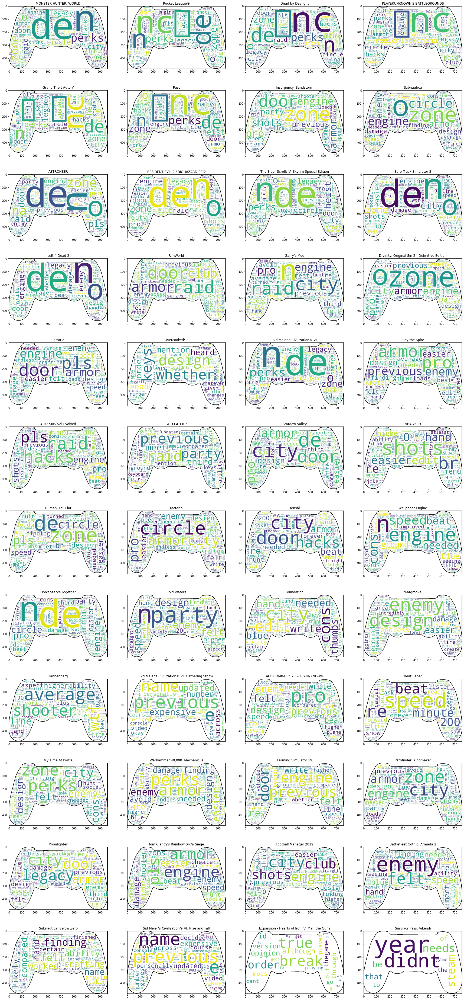

In [ ]:
from PIL import Image
from wordcloud import WordCloud
plt.figure()

#subplot(r,c) provide the no. of rows and columns
fig, axs = plt.subplots(12, 4) #12
fig.set_figheight(67.5)
fig.set_figwidth(30)

cnt = 0
# games = list(BOW.keys())
for game in tqdm(groupByGame):
  cloud_mask = np.array(Image.open("gg22.png"))
  wordcloud = WordCloud(width = 1000, height = 500, background_color="white",
                mask=cloud_mask, max_words=5000, contour_width=2, contour_color='black')
  wordcloud.generate_from_frequencies(tfidfByGame[game])


  # print(cnt%4,cnt%12)
  axs[cnt//4, cnt%4].imshow(wordcloud.to_array())
  axs[cnt//4, cnt%4].set_title(game)
  # axs[cnt//4, cnt%4].set_title("tmp")
  # plt.axis("off")
  cnt+=1
  
  # if cnt == 1:
  #   break

plt.show()

### We can very clearly observe when we compare these results to the wordcloud generated without the application of TFIDF. Here one can easily know what the game is about, while it was a bit hard in the original wordclouds to directly know what the game's genre is.

By just seeing the awsome result of this, I think the second application of TFIDF will easily require it's own section: -

## TFIDF in combination with various classification models by sklearn One Vs Rest Classifier (Similar to the ones we used for genre pred)

In [ ]:
%matplotlib inline
import re
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import nltk
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier
from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
import seaborn as sns


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
df = pd.DataFrame(dataset)

In [ ]:
df.head()

In [ ]:
df_rec = df.drop(['funny',"helpful","date","hrs","beta","genre"], axis=1)
counts = []
categories = list(df_rec.columns.values)
print(categories)
df_rec.head()

['rec', 'review', 'game']


,rec,review,game
0,1,Played as German Reich Declare war on Belgium...,Expansion - Hearts of Iron IV: Man the Guns
1,1,yes.,Expansion - Hearts of Iron IV: Man the Guns
2,1,Very good game although a bit overpriced in my...,Expansion - Hearts of Iron IV: Man the Guns
3,1,Out of all the reviews I wrote This one is pro...,Dead by Daylight
4,1,Disclaimer I survivor main. I play games for f...,Dead by Daylight


In [ ]:
dick = defaultdict(int)
for i in df_rec["rec"]:
  dick[i]+=1

In [ ]:
dick

defaultdict(int, {1: 303593, 0: 131298})

In [ ]:
df_stats = pd.DataFrame()
df_stats['rec'] = dick.keys()
df_stats['#Reviews'] = dick.values()
df_stats

,rec,#Reviews
0,1,303593
1,0,131298


Text(0.5, 0, 'Genre')

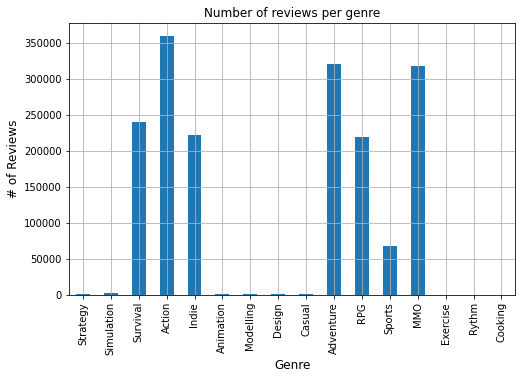

defaultdict(int, {2: 26164, 4: 987, 1: 89975, 3: 100777, 5: 20, 6: 216968})

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 0, '# of categories')

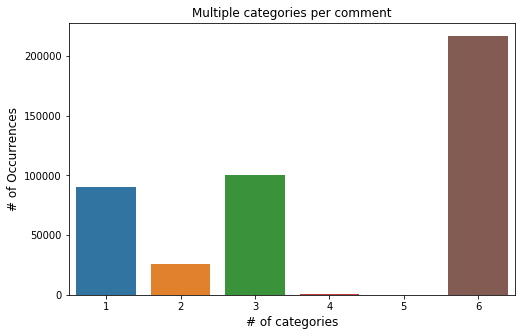

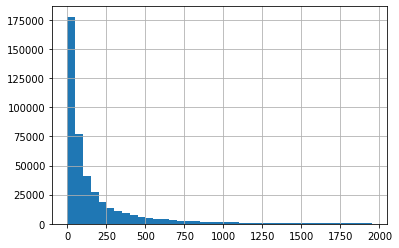

In [ ]:
lens = df_rec.review.str.len()
lens.hist(bins = np.arange(0,2000,50))

### Removing shortcuts

In [ ]:
def clean_text(text):
    text = text.lower()
    text = re.sub(r"what's", "what is ", text)
    text = re.sub(r"\'s", " ", text)
    text = re.sub(r"\'ve", " have ", text)
    text = re.sub(r"can't", "can not ", text)
    text = re.sub(r"n't", " not ", text)
    text = re.sub(r"i'm", "i am ", text)
    text = re.sub(r"\'re", " are ", text)
    text = re.sub(r"\'d", " would ", text)
    text = re.sub(r"\'ll", " will ", text)
    text = re.sub(r"\'scuse", " excuse ", text)
    text = re.sub('\W', ' ', text)
    text = re.sub('\s+', ' ', text)
    text = text.strip(' ')
    return text

In [ ]:
df_rec['review'] = df_rec['review'].map(lambda com : clean_text(com))
df_rec['review'][:2]

0    played as german reich declare war on belgium ...
1                                                  yes
Name: review, dtype: object

In [ ]:
df_rec['review'][2]

'very good game although a bit overpriced in my opinion i would prefer playing thegame with mods historical accuracy so on although the vanilla version isgood aswell 7 10'

In [ ]:
train, test = train_test_split(df_rec, random_state=42, test_size=0.23, shuffle=True)
X_train = train.review
X_test = test.review

In [ ]:
Results = defaultdict(list)

### TFIDF + MultinomialNB

In [ ]:
# Define a pipeline combining a text feature extractor with multi lable classifier
NB_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer(stop_words=stop_words)),
                ('clf', OneVsRestClassifier(MultinomialNB(
                    fit_prior=True, class_prior=None))),
            ])

print('... Processing')
# train the model using X_dtm & y
NB_pipeline.fit(X_train, train["rec"])
# compute the testing accuracy
prediction = NB_pipeline.predict(X_test)
print('Test accuracy is {}'.format(accuracy_score(test["rec"], prediction)))
Results[0].append(accuracy_score(test["rec"], prediction))

... Processing
Test accuracy is 0.7977205698575356


### TFIDF + LinearSVC

In [ ]:
SVC_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer(stop_words=stop_words)),
                ('clf', OneVsRestClassifier(LinearSVC(), n_jobs=1)),
            ])


print('... Processing')
# train the model using X_dtm & y
SVC_pipeline.fit(X_train, train["rec"])
# compute the testing accuracy
prediction = SVC_pipeline.predict(X_test)
print('Test accuracy is {}'.format(accuracy_score(test["rec"], prediction)))
Results[0].append(accuracy_score(test["rec"], prediction))

... Processing
Test accuracy is 0.8608247938015496


### TFIDF + Log reg

In [ ]:
LogReg_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer(stop_words=stop_words)),
                ('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=1)),
            ])
print('... Processing')
# train the model using X_dtm & y
LogReg_pipeline.fit(X_train, train["rec"])
# compute the testing accuracy
prediction = LogReg_pipeline.predict(X_test)
print('Test accuracy is {}'.format(accuracy_score(test["rec"], prediction)))
Results[0].append(accuracy_score(test["rec"], prediction))

... Processing
Test accuracy is 0.8645338665333666


### Result Visualization

In [ ]:
dfResults = pd.DataFrame(Results)
dfResults['Model'] = ["Naive Bayes","Linear Support Vector Classification","Logistic Regression"]

In [ ]:
dfResults.head()

,0,Model
0,0.797721,Naive Bayes
1,0.860825,Linear Support Vector Classification
2,0.864534,Logistic Regression


<BarContainer object of 3 artists>

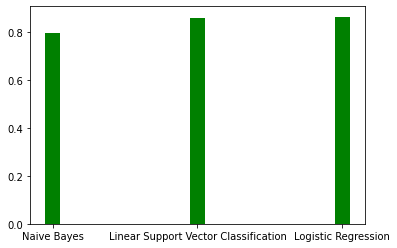

In [ ]:

x = ["Naive Bayes","Linear Support Vector Classification","Logistic Regression"]
# y = []
# for g in x:
#   x = dfResults[g]


# dfTmp = dfResults.set_index('Model')
# dfTmp = dfTmp.transpose()
# fig = plt.figure(figsize=(12, 20))
# plt.figure(figsize=(100,10))
# plt.xticks("index",x, rotation=90)
# hist(df._id, weights=df.total)
plt.bar(x, Results[0], width=0.1, color='g')


### Observing the graph we can see that Log reg gave the best results!, Let's try to beat this 0.8645 accuracy by incorporating sentimental analysis to the model!

## Sentimental Anal

In [ ]:
%%capture
!pip install stopwords
!pip install flair
!pip install nltk
!pip install swifter

In [ ]:
import pandas as pd
import numpy as np
import flair
from flair.data import Sentence
import re
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import random as rn
import seaborn as sns
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
from collections import Counter
from PIL import Image

In [ ]:
df = pd.DataFrame(dataset)

In [ ]:
df_rec = df.drop(['funny',"helpful","date","hrs","beta","genre"], axis=1)
counts = []
categories = list(df_rec.columns.values)
print(categories)
df_rec.head()

['rec', 'review', 'game']


,rec,review,game
0,1,Played as German Reich Declare war on Belgium...,Expansion - Hearts of Iron IV: Man the Guns
1,1,yes.,Expansion - Hearts of Iron IV: Man the Guns
2,1,Very good game although a bit overpriced in my...,Expansion - Hearts of Iron IV: Man the Guns
3,1,Out of all the reviews I wrote This one is pro...,Dead by Daylight
4,1,Disclaimer I survivor main. I play games for f...,Dead by Daylight


In [ ]:
dick = defaultdict(int)
for i in df_rec["rec"]:
  dick[i]+=1

In [ ]:
dick

defaultdict(int, {1: 303593, 0: 131298})

### Visulazing the number of reviews for recommended vs not recommened

In [ ]:
df_stats = pd.DataFrame()
df_stats['rec'] = dick.keys()
df_stats['#Reviews'] = dick.values()
df_stats

,rec,#Reviews
0,1,303593
1,0,131298


Don't mind some OG Pacman XD


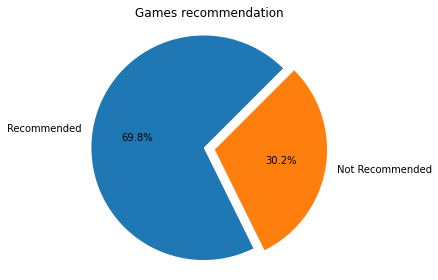

In [ ]:
sizes = [df_rec.rec.value_counts()[1], df_rec.rec.value_counts()[0]]
labels = ['Recommended', 'Not Recommended']

explode = (0, 0.1)
fig1, ax1 = plt.subplots()
ax1.set_title('Games recommendation')
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=False, startangle=45)
print("Don't mind some OG Pacman XD")
ax1.axis('equal')  
plt.tight_layout()
plt.show()

### We can clearly see from the pacman like pie chart above, that there is a huge imbalance between the number of positive samples and negative samples.

IMO this could cause a problem while training a model.
Let's see the result anyways, then we will try to fix this.

### Word cloud of the whole dataset

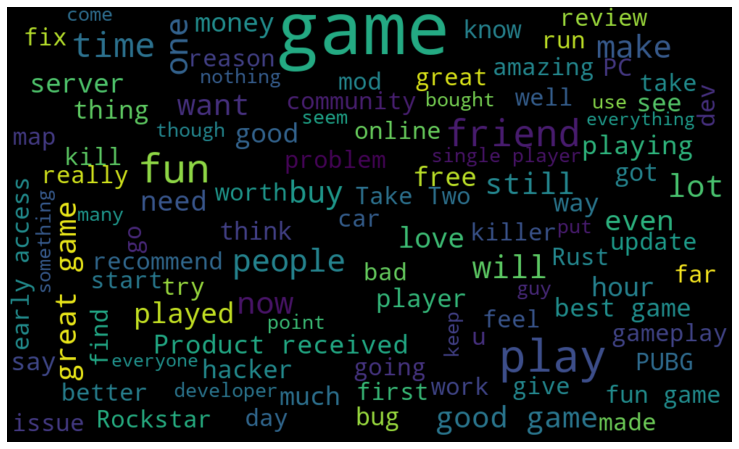

In [ ]:
txt = ' '.join(rev for rev in df_rec.review)
plt.figure(figsize=(15,8))

wordcloud = WordCloud(
            background_color = 'black',
            max_font_size = 100,
            max_words = 100,
            width = 1000,
            height = 600
            ).generate(txt)


plt.imshow(wordcloud,interpolation = 'bilinear')
plt.axis('off')
plt.show()

### Word cloud of positive and negative samples

In [ ]:
positive = df_rec[df_rec['rec']==1]
negative = df_rec[df_rec['rec']==0]

In [ ]:
positive.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 303593 entries, 0 to 434890
Data columns (total 3 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   rec     303593 non-null  int64 
 1   review  303593 non-null  object
 2   game    303593 non-null  object
dtypes: int64(1), object(2)
memory usage: 9.3+ MB


#### Positive (RECOMMENDED)


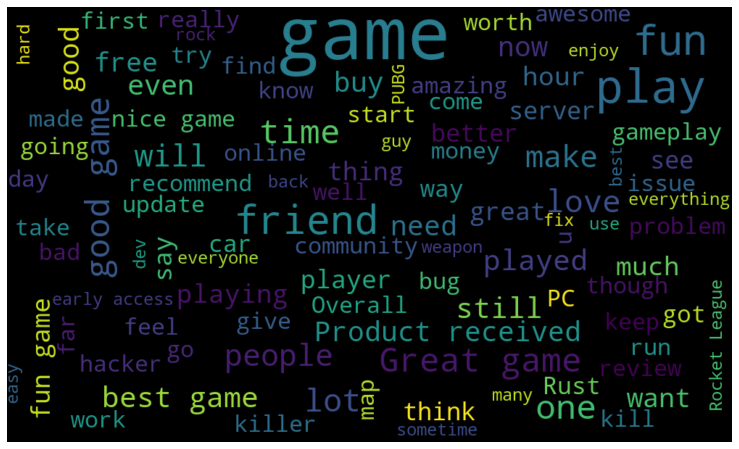

In [ ]:
txt = ' '.join(rev for rev in positive.review)
plt.figure(figsize=(15,8))

wordcloud = WordCloud(
            background_color = 'black',
            max_font_size = 100,
            max_words = 100,
            width = 1000,
            height = 600
            ).generate(txt)


plt.imshow(wordcloud,interpolation = 'bilinear')
plt.axis('off')
plt.show()

#### Negative (NOT REC)

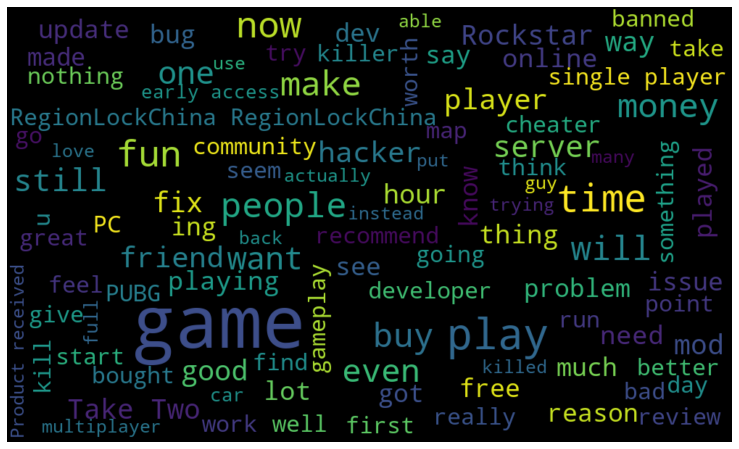

In [ ]:
txt = ' '.join(rev for rev in negative.review)
plt.figure(figsize=(15,8))

wordcloud = WordCloud(
            background_color = 'black',
            max_font_size = 100,
            max_words = 100,
            width = 1000,
            height = 600
            ).generate(txt)


plt.imshow(wordcloud,interpolation = 'bilinear')
plt.axis('off')
plt.show()

In [ ]:
df_tmp = df_rec.copy()

In [ ]:
df_tmp['reviewLen'] = df_tmp['review'].apply(lambda x:len(str(x).split()))

(0.0, 500.0)

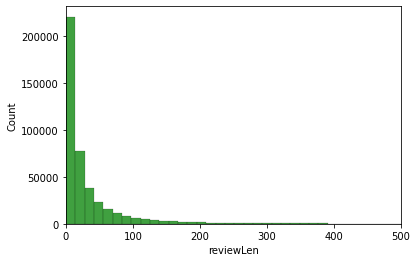

In [ ]:
sns.histplot(data=df_tmp, x="reviewLen",bins=200,color='green')
plt.xlim(0,500)

In [ ]:
df_tmp["reviewLen"].max()

2792

### Words by their count (MOST POPULAR) before preprocessing

In [ ]:
df_tmp['temp_list'] = df_tmp['review'].apply(lambda x:str(x).split())
top = Counter([item for sublist in df_tmp['temp_list'] for item in sublist])
temp = pd.DataFrame(top.most_common(20))
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Reds')

,Common_words,count
0,the,524144
1,and,390928
2,to,390086
3,a,367673
4,game,364811
5,is,274000
6,of,253352
7,I,227737
8,you,225066
9,it,193359


#### Preprocessing equivalent to the one we did for wordcloud per game

In [ ]:
from nltk.corpus import stopwords
from nltk import WordNetLemmatizer
nltk.download('stopwords')
from nltk.stem import PorterStemmer

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
def clean(raw):
    """ Remove hyperlinks and markup """
    result = re.sub("<[a][^>]*>(.+?)</[a]>", 'Link.', raw)
    result = re.sub('&gt;', "", result)
    result = re.sub('&#x27;', "'", result)
    result = re.sub('&quot;', '"', result)
    result = re.sub('&#x2F;', ' ', result)
    result = re.sub('<p>', ' ', result)
    result = re.sub('</i>', '', result)
    result = re.sub('&#62;', '', result)
    result = re.sub('<i>', ' ', result)
    result = re.sub("\n", '', result)
    return result

In [ ]:
def remove_num(texts):
   output = re.sub(r'\d+', '', texts)
   return output

In [ ]:
def unify_whitespaces(x):
    cleaned_string = re.sub(' +', ' ', x)
    return cleaned_string 

In [ ]:
def remove_symbols(x):
    cleaned_string = re.sub(r"[^a-zA-Z0-9?!.,]+", ' ', x)
    return cleaned_string

In [ ]:
def remove_punctuation(text):
    final = "".join(u for u in text if u not in ("?", ".", ";", ":",  "!",'"',','))
    return final

In [ ]:
stop=set(stopwords.words("english"))
stemmer=PorterStemmer()
lemma=WordNetLemmatizer()

def remove_stopword(text):
   text=[word.lower() for word in text.split() if word.lower() not in stop]
   return " ".join(text)

In [ ]:
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
def Stemming(text):
   stem=[]
   stopword = stopwords.words('english')
   snowball_stemmer = SnowballStemmer('english')
   word_tokens = nltk.word_tokenize(text)
   stemmed_word = [snowball_stemmer.stem(word) for word in word_tokens]
   stem=' '.join(stemmed_word)
   return stem

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
def cleaning(df,review):
    df[review] = df[review].apply(clean)
    df[review] = df[review].str.lower()
    df[review] = df[review].apply(remove_num)
    df[review] = df[review].apply(remove_symbols)
    df[review] = df[review].apply(remove_punctuation)
    df[review] = df[review].apply(remove_stopword)
    df[review] = df[review].apply(unify_whitespaces)
    df[review] = df[review].apply(Stemming)

In [ ]:
cleaning(df_rec,'review')

In [ ]:
df_rec.head()

,rec,review,game
0,1,play german reich declar war belgium break bel...,Expansion - Hearts of Iron IV: Man the Guns
1,1,yes,Expansion - Hearts of Iron IV: Man the Guns
2,1,good game although bit overpr opinion prefer p...,Expansion - Hearts of Iron IV: Man the Guns
3,1,review wrote one probabl serious one iwrot sta...,Dead by Daylight
4,1,disclaim survivor main play game fun competit ...,Dead by Daylight


In [ ]:
df_tmp = df_rec.copy()

### Most popular words after preprocessing. We can clearly see that the words are now more specific to this dataset.

In [ ]:
df_tmp['temp_list'] = df_tmp['review'].apply(lambda x:str(x).split())
top = Counter([item for sublist in df_tmp['temp_list'] for item in sublist])
temp = pd.DataFrame(top.most_common(20))
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Reds')

,Common_words,count
0,game,499370
1,play,141809
2,get,96455
3,fun,84842
4,good,77017
5,like,72748
6,time,59204
7,great,50237
8,one,46830
9,friend,44321


#### Here we are using sklearn's word vectorizer followed by tfidf finishing by random forest classifier


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer
from sklearn.ensemble import RandomForestClassifier
clf = Pipeline([
    ('vect', CountVectorizer(stop_words= "english",max_features=4000)),
    ('tfidf', TfidfTransformer()),
    ('classifier', RandomForestClassifier()),
    ])

In [ ]:
X = df_rec['review']
y = df_rec['rec']

In [ ]:
from collections import Counter
Counter(y)

Counter({1: 303593, 0: 131298})

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state = 40,
                                                   test_size = 0.20)

In [ ]:
text_classifier = clf.fit(X_train,y_train)

In [ ]:
predictions = text_classifier.predict(X_test)

In [ ]:
np.unique(predictions)

array([0, 1])

In [ ]:
# find accuracy, precision, recall:
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import f1_score, accuracy_score, plot_confusion_matrix, roc_auc_score
confusion_matrix(y_test,predictions)

array([[17522,  8727],
       [ 5023, 55707]])

In [ ]:
def Confusion_Matrix(y_test,ypred):
    cfmat = confusion_matrix(y_test,ypred)
    print('Confusion Matrix: \n',classification_report(y_test,ypred,labels=[1,-1]))
    print("\n")
    print('TP - True Positive {}'.format(cfmat[1,1]))
    print('FN - False Negative {}'.format(cfmat[1,0]))
    print('FP - False Positive {}'.format(cfmat[0,1]))
    print('TN - True Negative {}'.format(cfmat[0,0]))
    print('Accuracy Rate: {}'.format(np.divide(np.sum([cfmat[0,0],cfmat[1,1]]),np.sum(cfmat))))
    print('Misclassification Rate: {}'.format(np.divide(np.sum([cfmat[0,1],cfmat[1,0]]),np.sum(cfmat))))
    print('F1-Score: {}'.format(f1_score(y_test, ypred,average='macro')))
    print('ROC-AUC {}'.format(roc_auc_score(y_test,ypred)))

In [ ]:
Confusion_Matrix(y_test,predictions)

Confusion Matrix: 
               precision    recall  f1-score   support

           1       0.86      0.92      0.89     60730
          -1       0.00      0.00      0.00         0

   micro avg       0.86      0.92      0.89     60730
   macro avg       0.43      0.46      0.45     60730
weighted avg       0.86      0.92      0.89     60730



TN - True Negative 55749
FP - False Positive 4981
FN - False Negative 8729
TP - True Positive 17520
Accuracy Rate: 0.8423757458696927
Misclassification Rate: 0.1576242541303073
F1-Score: 0.8046357175506111
ROC-AUC 0.7927176133177494


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1

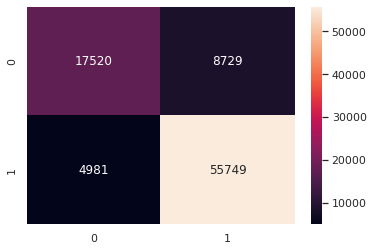

In [ ]:
sns.heatmap(confusion_matrix(y_test,predictions),annot=True,fmt='')

### Result Analysis: - 
Accuracy Rate: 0.8423757458696927

Misclassification Rate: 0.1576242541303073

F1-Score: 0.8046357175506111

ROC-AUC 0.7927176133177494

You can see that we got a good accuracy, but our roc-auc score is not upto the mark. This just strengthens my doubt in the imbalance issue between positive and negative samples I mentioned before. 
IMO, due to positive samples outweighing the negative samples by 3x times, we are indirectly overfitting our model to predict positive over not recommended. 

To fix this let's try using the oversampling and undersampling strategy. For this we will use the imblearn's library that will make this process more streamline.

### Fixing the imbalance:


In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as PL

In [ ]:
strategy1 = {0:203593}
strategy2 = {1:203593}

vect = CountVectorizer(stop_words= "english",max_features=3000)
tfidf = TfidfTransformer()
over = SMOTE(sampling_strategy=strategy1)
under = RandomUnderSampler(sampling_strategy=strategy2)
model = RandomForestClassifier()

In [ ]:
X = df_rec['review'].values
y = df_rec['rec'].values

In [ ]:
Counter(y)

Counter({1: 303593, 0: 131298})

In [ ]:
trf = vect.fit(X)
X = trf.transform(X)

In [ ]:
steps = [('over', over), ('under', under)]
pipeline = PL(steps=steps)

In [ ]:
X_new, y_new = pipeline.fit_resample(X, y)

### We can clearly observe through the packman that we have exactly 50% Recommended(+ve) samples and 50% (-ve) samples!!

Now let's train on this

In [ ]:
counter_new = Counter(y_new)
print("Tweet Sentiment Class Proportion after oversampling and undersampling: \n",counter_new)

Tweet Sentiment Class Proportion after oversampling and undersampling: 
 Counter({0: 203593, 1: 203593})


Don't mind some OG Pacman XD


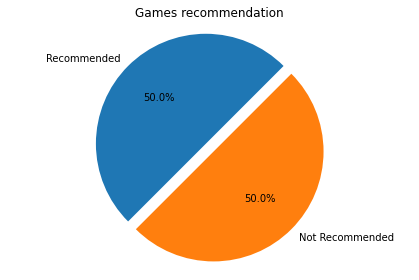

In [ ]:
sizes = [df.rec.value_counts()[1], df.rec.value_counts()[0]]
labels = ['Recommended', 'Not Recommended']

explode = (0, 0.1)
fig1, ax1 = plt.subplots()
ax1.set_title('Games recommendation')
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=False, startangle=45)
print("Don't mind some OG Pacman XD")
ax1.axis('equal')  
plt.tight_layout()
plt.show()

In [ ]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_new, y_new,random_state = 40,
                                                   test_size = 0.20)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state = 40,
                                                   test_size = 0.20)

In [ ]:
Counter(y)

Counter({1: 303593, 0: 131298})

In [ ]:
pipeline2 = Pipeline([
    ('tfidf', tfidf),
    ('model', model),
    ])

In [ ]:
text_classifier2 = pipeline2.fit(X_train2,y_train2)

In [ ]:
predictions2 = text_classifier2.predict(X_test)

In [ ]:
Confusion_Matrix(y_test,predictions2)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1

Confusion Matrix: 
               precision    recall  f1-score   support

           1       0.96      0.90      0.93     60730
          -1       0.00      0.00      0.00         0

   micro avg       0.96      0.90      0.93     60730
   macro avg       0.48      0.45      0.47     60730
weighted avg       0.96      0.90      0.93     60730



TN - True Negative 54959
FP - False Positive 5771
FN - False Negative 2462
TP - True Positive 23787
Accuracy Rate: 0.9053449683256878
Misclassification Rate: 0.09465503167431219
F1-Score: 0.8913958434678934
ROC-AUC 0.9055893906321928


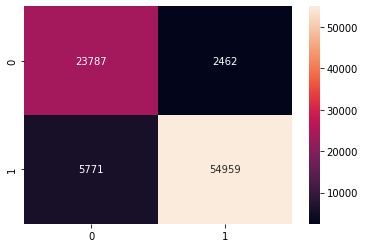

In [ ]:
sns.heatmap(confusion_matrix(y_test,predictions2),annot=True,fmt='')

### Result Analysis after balanced sampling:
Accuracy Rate: 0.9053449683256878
Misclassification Rate: 0.09465503167431219
F1-Score: 0.8913958434678934
ROC-AUC 0.9055893906321928

By balancing the sampling, we did not only greatly boost our ROC AUC score, but also had an increase in the accuracy of predicting.

We also beat our target of beating the logistic regression accuracy of 0.864.

Yayy!!

# Multi class Genre Prediction

## TFIDF in combination with various classification models by sklearn One Vs Rest Classifier

In [ ]:
%matplotlib inline
import re
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
import seaborn as sns


### Model specific preprocessing

In [ ]:
df = pd.DataFrame(dataset)

In [ ]:
df.head()

,date,funny,helpful,hrs,beta,rec,review,game,genre
0,2019-02-10,2.0,4.0,578.0,0,1,Played as German Reich Declare war on Belgium...,Expansion - Hearts of Iron IV: Man the Guns,"[Strategy, Simulation]"
1,2019-02-10,0.0,0.0,184.0,0,1,yes.,Expansion - Hearts of Iron IV: Man the Guns,"[Strategy, Simulation]"
2,2019-02-07,0.0,0.0,892.0,0,1,Very good game although a bit overpriced in my...,Expansion - Hearts of Iron IV: Man the Guns,"[Strategy, Simulation]"
3,2018-06-14,126.0,1086.0,676.0,0,1,Out of all the reviews I wrote This one is pro...,Dead by Daylight,"[Survival, Action]"
4,2017-06-20,85.0,2139.0,612.0,0,1,Disclaimer I survivor main. I play games for f...,Dead by Daylight,"[Survival, Action]"


In [ ]:
df_genre = df.drop(['funny',"helpful","date","hrs","beta","rec"], axis=1)
counts = []
categories = list(df_genre.columns.values)
print(categories)
df_genre.head()

['review', 'game', 'genre']


,review,game,genre
0,Played as German Reich Declare war on Belgium...,Expansion - Hearts of Iron IV: Man the Guns,"[Strategy, Simulation]"
1,yes.,Expansion - Hearts of Iron IV: Man the Guns,"[Strategy, Simulation]"
2,Very good game although a bit overpriced in my...,Expansion - Hearts of Iron IV: Man the Guns,"[Strategy, Simulation]"
3,Out of all the reviews I wrote This one is pro...,Dead by Daylight,"[Survival, Action]"
4,Disclaimer I survivor main. I play games for f...,Dead by Daylight,"[Survival, Action]"


### Further Visualization

In [ ]:
dick = defaultdict(int)
for i in df_genre["genre"]:
  for g in i:
    dick[g]+=1

In [ ]:
dick

defaultdict(int,
            {'Strategy': 1405,
             'Simulation': 1709,
             'Survival': 239413,
             'Action': 359716,
             'Indie': 222292,
             'Animation': 170,
             'Modelling': 170,
             'Design': 170,
             'Casual': 564,
             'Adventure': 320874,
             'RPG': 219123,
             'Sports': 67927,
             'MMO': 316927,
             'Exercise': 10,
             'Rythm': 10,
             'Cooking': 10})

#### Number of reviews per genre

In [ ]:
df_stats = pd.DataFrame()
df_stats['Genre'] = dick.keys()
df_stats['#Reviews'] = dick.values()
df_stats

,Genre,#Reviews
0,Strategy,1405
1,Simulation,1709
2,Survival,239413
3,Action,359716
4,Indie,222292
5,Animation,170
6,Modelling,170
7,Design,170
8,Casual,564
9,Adventure,320874


Text(0.5, 0, 'Genre')

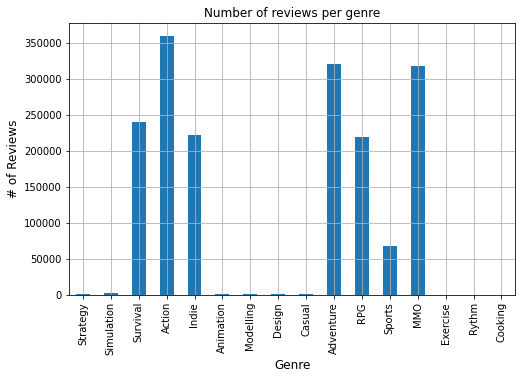

In [ ]:
df_stats.plot(x='Genre', y='#Reviews', kind='bar', legend=False, grid=True, figsize=(8, 5))
plt.title("Number of reviews per genre")
plt.ylabel('# of Reviews', fontsize=12)
plt.xlabel('Genre', fontsize=12)

#### How many Games have how many genres?

In [ ]:
dick = defaultdict(int)
for i in df_genre["genre"]:
  dick[len(i)]+=1
dick  

defaultdict(int, {2: 26164, 4: 987, 1: 89975, 3: 100777, 5: 20, 6: 216968})

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 0, '# of categories')

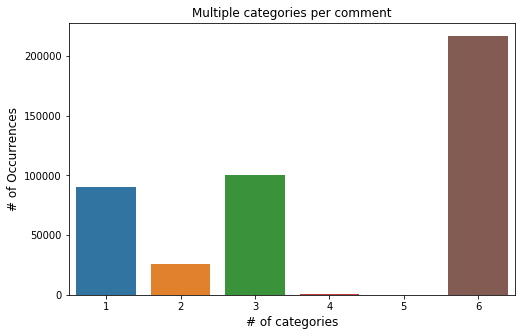

In [ ]:
plt.figure(figsize=(8,5))
ax = sns.barplot(list(dick.keys()), list(dick.values()))
plt.title("Multiple categories per comment")
plt.ylabel('# of Occurrences', fontsize=12)
plt.xlabel('# of categories', fontsize=12)

#### Number of reviews based on length

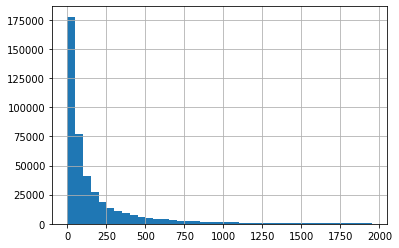

In [ ]:
lens = df_genre.review.str.len()
lens.hist(bins = np.arange(0,2000,50))

### Model Specific Cleaning

#### After analyzing the review text we saw a lot of common texting shortcuts and decided to replace them with normal words.

In [ ]:
def clean_text(text):
    text = text.lower()
    text = re.sub(r"n't", " not ", text)
    text = re.sub(r"i'm", "i am ", text)
    text = re.sub(r"\'re", " are ", text)
    text = re.sub(r"\'d", " would ", text)
    text = re.sub(r"\'s", " ", text)
    text = re.sub(r"\'ve", " have ", text)
    text = re.sub(r"can't", "can not ", text)
    text = re.sub(r"\'ll", " will ", text)
    text = re.sub(r"\'scuse", " excuse ", text)
    text = re.sub(r"what's", "what is ", text)
    text = re.sub('\W', ' ', text)
    text = re.sub('\s+', ' ', text)
    text = text.strip(' ')
    return text

In [ ]:
df_genre['review'] = df_genre['review'].map(lambda com : clean_text(com))
df_genre['review'][:2]

0    played as german reich declare war on belgium ...
1                                                  yes
Name: review, dtype: object

In [ ]:
df_genre['review'][2]

'very good game although a bit overpriced in my opinion i would prefer playing thegame with mods historical accuracy so on although the vanilla version isgood aswell 7 10'

In [ ]:
allGenre


{'Action',
 'Adventure',
 'Animation',
 'Casual',
 'Cooking',
 'Design',
 'Exercise',
 'Indie',
 'MMO',
 'Modelling',
 'RPG',
 'Rythm',
 'Simulation',
 'Sports',
 'Strategy',
 'Survival'}

#### One hot encoding the genres for the whole dataset

In [ ]:
def resetDick():
  allGenreDick = {}
  for i in list(allGenre):
    allGenreDick[i] = 0
  return allGenreDick

In [ ]:
finalGenre = defaultdict(list)
mapp = resetDick()
for i in df_genre["genre"]:
  for g in i:
    mapp[g] = 1
  for g in allGenre:
    finalGenre[g].append(mapp[g])
  mapp = resetDick()

In [ ]:
for g in finalGenre:
  df_genre[g] = finalGenre[g]

In [ ]:
df_genre.head()

,review,game,genre,MMO,Rythm,Animation,Action,Design,RPG,Modelling,Cooking,Simulation,Casual,Indie,Exercise,Survival,Adventure,Sports,Strategy
0,played as german reich declare war on belgium ...,Expansion - Hearts of Iron IV: Man the Guns,"[Strategy, Simulation]",0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
1,yes,Expansion - Hearts of Iron IV: Man the Guns,"[Strategy, Simulation]",0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
2,very good game although a bit overpriced in my...,Expansion - Hearts of Iron IV: Man the Guns,"[Strategy, Simulation]",0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
3,out of all the reviews i wrote this one is pro...,Dead by Daylight,"[Survival, Action]",0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
4,disclaimer i survivor main i play games for fu...,Dead by Daylight,"[Survival, Action]",0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0


### Splitting the dataset

In [ ]:
genres = list(allGenre)
train, test = train_test_split(df_genre, random_state=42, test_size=0.23, shuffle=True)
X_train = train.review
X_test = test.review

In [ ]:
Results = defaultdict(list)

### TFIDF + Logitic Regression

In [ ]:
tmp1 = prediction
tmp2 = np.array(test[g].tolist())
print(type(tmp1),"\n",type(tmp2))
tmp3 = tmp1==tmp2
print(np.sum(tmp3)/len(tmp3))

<class 'numpy.ndarray'> 
 <class 'numpy.ndarray'>
0.9971107223194201


In [ ]:
LogReg_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer(stop_words=stop_words)),
                ('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=1)),
            ])
total = 0
corr = 0
for g in genres:
    print('... Processing {}'.format(g))
    # train the model using X_dtm & y
    LogReg_pipeline.fit(X_train, train[g])
    # compute the testing accuracy
    prediction = LogReg_pipeline.predict(X_test)
    # print('Test accuracy is {}'.format(accuracy_score(test[g], prediction)))

    tmp = np.array(test[g].tolist())

    tmp2 = tmp==prediction
    sumi = np.sum(tmp2)
    tmpAcc = sumi/len(tmp2)

    corr+=sumi
    total+=len(tmp2)

    print('Test accuracy is {}'.format(tmpAcc))
    Results[g].append(tmpAcc)

print("\n\nFULL MODEL ACCURACY = ",corr/total)

... Processing MMO
Test accuracy is 0.8374306423394151
... Processing Rythm
Test accuracy is 0.9999600099975007
... Processing Animation
Test accuracy is 0.9995701074731317
... Processing Action
Test accuracy is 0.8833791552111973
... Processing Design
Test accuracy is 0.9995701074731317
... Processing RPG
Test accuracy is 0.7851937015746063
... Processing Modelling
Test accuracy is 0.9995701074731317
... Processing Cooking
Test accuracy is 0.9999700074981255
... Processing Simulation
Test accuracy is 0.9964008997750562
... Processing Casual
Test accuracy is 0.9986903274181455
... Processing Indie
Test accuracy is 0.785983504123969
... Processing Exercise
Test accuracy is 0.9999600099975007
... Processing Survival
Test accuracy is 0.7913121719570108
... Processing Adventure
Test accuracy is 0.8418695326168458
... Processing Sports
Test accuracy is 0.89471632091977
... Processing Strategy
Test accuracy is 0.9971107223194201


FULL MODEL ACCURACY =  0.9256679580104974


### TFIDF + Multinomial Naive Bayes

In [ ]:
# Define a pipeline combining a text feature extractor with multi lable classifier
NB_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer(stop_words=stop_words)),
                ('clf', OneVsRestClassifier(MultinomialNB(
                    fit_prior=True, class_prior=None))),
            ])
total = 0
corr = 0
for g in genres:
    print('... Processing {}'.format(g))
    # train the model using X_dtm & y
    NB_pipeline.fit(X_train, train[g])
    # compute the testing accuracy
    prediction = NB_pipeline.predict(X_test)
    # print('Test accuracy is {}'.format(accuracy_score(test[g], prediction)))
    
    tmp = np.array(test[g].tolist())

    tmp2 = tmp==prediction
    sumi = np.sum(tmp2)
    tmpAcc = sumi/len(tmp2)

    corr+=sumi
    total+=len(tmp2)

    print('Test accuracy is {}'.format(tmpAcc))
    Results[g].append(tmpAcc)

print("\n\nFULL MODEL ACCURACY = ",corr/total)

... Processing MMO
Test accuracy is 0.7771657085728568
... Processing Rythm
Test accuracy is 0.9999600099975007
... Processing Animation
Test accuracy is 0.9995601099725069
... Processing Action
Test accuracy is 0.8410997250687328
... Processing Design
Test accuracy is 0.9995601099725069
... Processing RPG
Test accuracy is 0.7815546113471632
... Processing Modelling
Test accuracy is 0.9995601099725069
... Processing Cooking
Test accuracy is 0.9999700074981255
... Processing Simulation
Test accuracy is 0.9961909522619345
... Processing Casual
Test accuracy is 0.9986903274181455
... Processing Indie
Test accuracy is 0.7831942014496376
... Processing Exercise
Test accuracy is 0.9999600099975007
... Processing Survival
Test accuracy is 0.777025743564109
... Processing Adventure
Test accuracy is 0.7819245188702825
... Processing Sports
Test accuracy is 0.8556460884778805
... Processing Strategy
Test accuracy is 0.9967608097975507


FULL MODEL ACCURACY =  0.9117389402649337


### TFIDF + Linear Support Vector Machine

In [ ]:
SVC_pipeline = Pipeline([
                ('tfidf', TfidfVectorizer(stop_words=stop_words)),
                ('clf', OneVsRestClassifier(LinearSVC(), n_jobs=1)),
            ])
total = 0
corr = 0
for g in genres:
    print('... Processing {}'.format(g))
    # train the model using X_dtm & y
    SVC_pipeline.fit(X_train, train[g])
    # compute the testing accuracy
    prediction = SVC_pipeline.predict(X_test)
    # print('Test accuracy is {}'.format(accuracy_score(test[g], prediction)))
    
    tmp = np.array(test[g].tolist())

    tmp2 = tmp==prediction
    sumi = np.sum(tmp2)
    tmpAcc = sumi/len(tmp2)

    corr+=sumi
    total+=len(tmp2)

    print('Test accuracy is {}'.format(tmpAcc))
    Results[g].append(tmpAcc)

print("\n\nFULL MODEL ACCURACY = ",corr/total)

... Processing MMO
Test accuracy is 0.8361209697575606
... Processing Rythm
Test accuracy is 0.9999600099975007
... Processing Animation
Test accuracy is 0.9996400899775056
... Processing Action
Test accuracy is 0.8832591852036991
... Processing Design
Test accuracy is 0.9996400899775056
... Processing RPG
Test accuracy is 0.7823544113971507
... Processing Modelling
Test accuracy is 0.9996400899775056
... Processing Cooking
Test accuracy is 0.9999700074981255
... Processing Simulation
Test accuracy is 0.9966508372906774
... Processing Casual
Test accuracy is 0.9987103224193952
... Processing Indie
Test accuracy is 0.7836740814796301
... Processing Exercise
Test accuracy is 0.9999600099975007
... Processing Survival
Test accuracy is 0.78912271932017
... Processing Adventure
Test accuracy is 0.8411397150712322
... Processing Sports
Test accuracy is 0.8947063234191452
... Processing Strategy
Test accuracy is 0.9975606098475381


FULL MODEL ACCURACY =  0.9251318420394902


### We can see that the overall accuracy of logreg is the best compared to the other two

### Visualization of the results

In [ ]:
dfResults = pd.DataFrame(Results)
dfResults['Model'] = ["Logistic Regression","Naive Bayes","Linear Support Vector Classification"]

In [ ]:
dfResults = dfResults[['Model','Adventure', 'RPG', 'Animation', 'Design', 'Rythm', 'Indie', 'Survival', 'Simulation', 'Cooking', 'Casual', 'MMO', 'Exercise',
       'Sports', 'Strategy', 'Action', 'Modelling']]
dfResults

,Model,Adventure,RPG,Animation,Design,Rythm,Indie,Survival,Simulation,Cooking,Casual,MMO,Exercise,Sports,Strategy,Action,Modelling
0,Logistic Regression,0.841870,0.785194,0.99957,0.99957,0.99996,0.785974,0.791302,0.996401,0.99997,0.99869,0.837451,0.99996,0.894716,0.997111,0.883379,0.99957
1,Naive Bayes,0.781925,0.781555,0.99956,0.99956,0.99996,0.783194,0.777026,0.996191,0.99997,0.99869,0.777166,0.99996,0.855646,0.996761,0.841100,0.99956
2,Linear Support Vector Classification,0.841140,0.782354,0.99964,0.99964,0.99996,0.783674,0.789123,0.996651,0.99997,0.99871,0.836121,0.99996,0.894706,0.997561,0.883259,0.99964


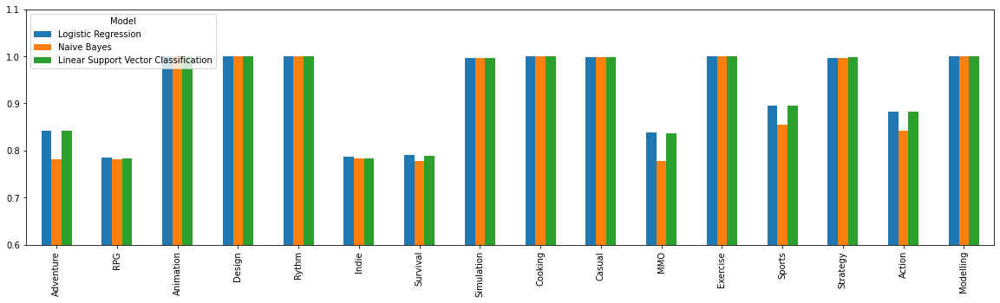

In [ ]:
dfTmp = dfResults.set_index('Model')
dfTmp = dfTmp.transpose()


dfTmp.plot(kind='bar',figsize=(20,5))
plt.ylim([0.6,1.1])
plt.show()

## BERT (In progress)

In [ ]:
# !wget https://raw.githubusercontent.com/tensorflow/models/master/official/nlp/bert/tokenization.py

--2022-11-24 05:49:31--  https://raw.githubusercontent.com/tensorflow/models/master/official/nlp/bert/tokenization.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2022-11-24 05:49:31 ERROR 404: Not Found.



In [ ]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
%matplotlib inline

import tensorflow as tf
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint
import tensorflow_hub as hub
import os


In [ ]:
df = pd.DataFrame(dataset)
df.head()

,date,funny,helpful,hrs,beta,rec,review,game,genre
0,2019-02-10,2.0,4.0,578.0,0,1,Played as German Reich Declare war on Belgium...,Expansion - Hearts of Iron IV: Man the Guns,"[Strategy, Simulation]"
1,2019-02-10,0.0,0.0,184.0,0,1,yes.,Expansion - Hearts of Iron IV: Man the Guns,"[Strategy, Simulation]"
2,2019-02-07,0.0,0.0,892.0,0,1,Very good game although a bit overpriced in my...,Expansion - Hearts of Iron IV: Man the Guns,"[Strategy, Simulation]"
3,2018-06-14,126.0,1086.0,676.0,0,1,Out of all the reviews I wrote This one is pro...,Dead by Daylight,"[Survival, Action]"
4,2017-06-20,85.0,2139.0,612.0,0,1,Disclaimer I survivor main. I play games for f...,Dead by Daylight,"[Survival, Action]"


In [ ]:
df.describe()

,funny,helpful,hrs,beta,rec
count,4.348910e+05,434891.000000,434891.000000,434891.0,434891.000000
mean,5.333024e+05,1.004114,364.130773,0.0,0.698090
std,4.785640e+07,59.462935,545.961198,0.0,0.459087
min,0.000000e+00,0.000000,0.000000,0.0,0.000000
25%,0.000000e+00,0.000000,62.000000,0.0,0.000000
50%,0.000000e+00,0.000000,190.000000,0.0,1.000000
75%,0.000000e+00,0.000000,450.000000,0.0,1.000000
max,4.294967e+09,28171.000000,31962.000000,0.0,1.000000


In [ ]:
df.rec.value_counts()

1    303593
0    131298
Name: rec, dtype: int64

Don't mind some OG Pacman XD


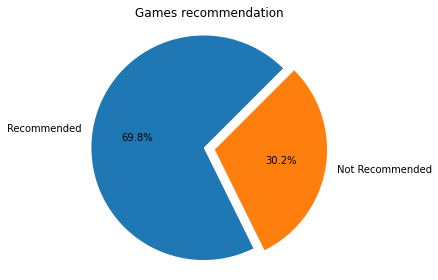

In [ ]:
sizes = [df.rec.value_counts()[1], df.rec.value_counts()[0]]
labels = ['Recommended', 'Not Recommended']

explode = (0, 0.1)
fig1, ax1 = plt.subplots()
ax1.set_title('Games recommendation')
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=False, startangle=45)
print("Don't mind some OG Pacman XD")
ax1.axis('equal')  
plt.tight_layout()
plt.show()

Text(0, 0.5, 'Number of reviews')

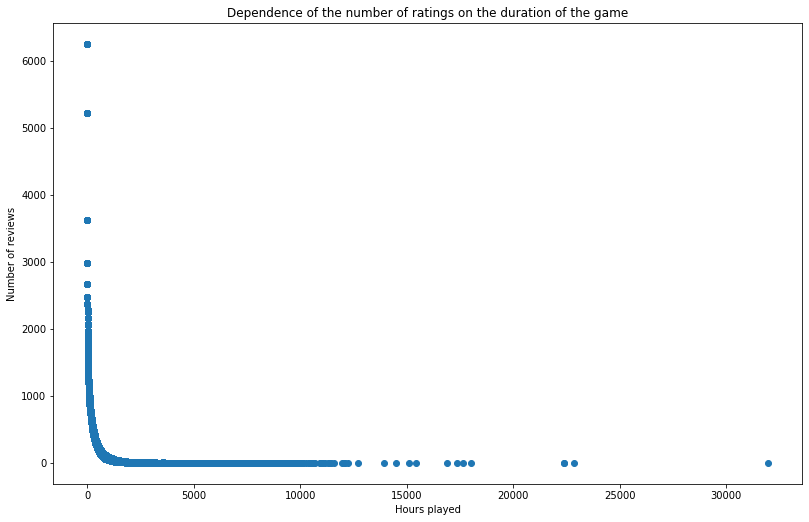

In [ ]:
df['timeBeforeReview'] = df.groupby('hrs')['hrs'].transform('count')
x = df.hrs
y = df['timeBeforeReview']
fig = plt.figure(figsize = (13,8))
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])
ax.scatter(x,y)
ax.set_title('Dependence of the number of ratings on the duration of the game')
ax.set_xlabel('Hours played')
ax.set_ylabel('Number of reviews')

In [ ]:
top_reviewed_games = df.game.value_counts()
print('Top 20 reviewed games:\n\n{}'.format(top_reviewed_games[:20]))
print("type:",type(top_reviewed_games[0]))
print(top_reviewed_games[0])

Top 20 reviewed games:

PLAYERUNKNOWN'S BATTLEGROUNDS                  145685
Grand Theft Auto V                              99956
Rust                                            71088
Rocket League®                                  67907
Dead by Daylight                                22221
MONSTER HUNTER: WORLD                           18412
ASTRONEER                                        2661
The Elder Scrolls V: Skyrim Special Edition      1473
RESIDENT EVIL 2 / BIOHAZARD RE:2                 1385
Sid Meier’s Civilization® VI                      522
Euro Truck Simulator 2                            501
Slay the Spire                                    260
Terraria                                          260
Subnautica                                        247
Left 4 Dead 2                                     221
Insurgency: Sandstorm                             220
RimWorld                                          204
Garry's Mod                                       202
Star

In [ ]:
dick = {"PLAYERUNKNOWN'S BATTLEGROUNDS":                  145685,
"Grand Theft Auto V":                              99956,
"Rust":                                            71088,
"Rocket League®":                                  67907,
"Dead by Daylight":                                22221,
"MONSTER HUNTER: WORLD":                           18412,
"ASTRONEER":                                        2661,
"The Elder Scrolls V: Skyrim Special Edition":      1473,
"RESIDENT EVIL 2 / BIOHAZARD RE:2":                 1385,
"Sid Meier’s Civilization® VI":                      522,
"Euro Truck Simulator 2":                            501,
"Slay the Spire":                                    260,
"Terraria":                                          260,
"Subnautica":                                        247,
"Left 4 Dead 2":                                     221,
"Insurgency: Sandstorm":                             220,
"RimWorld":                                          204,
"Garry's Mod":                                       202,
"Stardew Valley":                                    202,
"ARK: Survival Evolved":                             195}

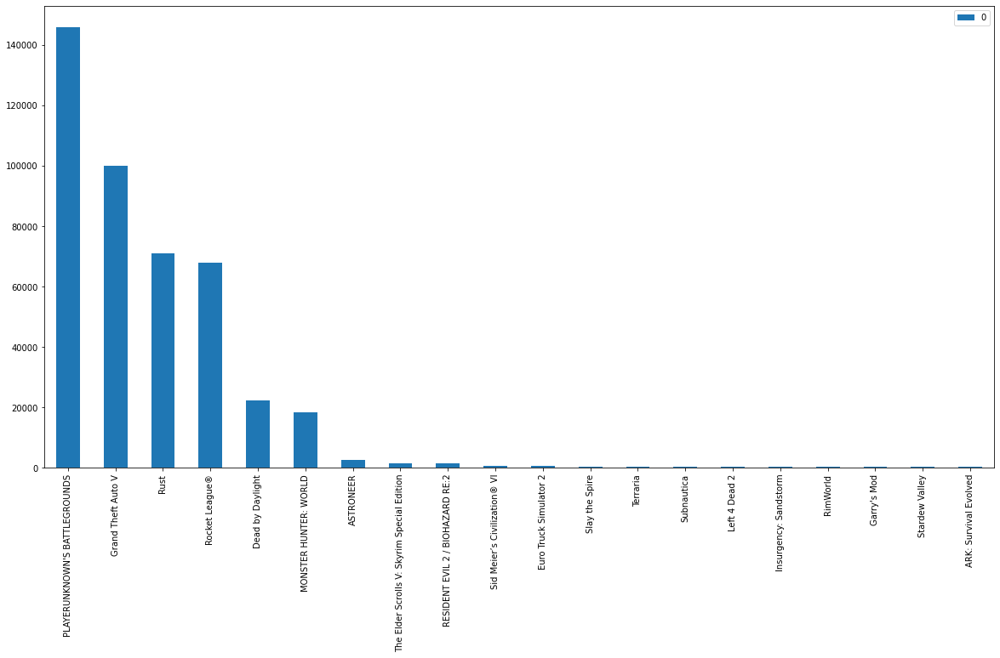

In [ ]:
tmpDF = pd.DataFrame(dick,index=[0]).T

# print("burh")
tmpDF.plot(kind="bar",figsize=(20,10))
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
X = df.review
y = df.rec
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state = 42, test_size=0.50)
for each in [y_train, y_test]:
    print(f"y fraction = {each.mean():.4f}")

y fraction = 0.6977
y fraction = 0.6985


In [ ]:
print('Train : {}, Test: {}'.format(len(X_train),len(X_test)))

Train : 217445, Test: 217446


In [ ]:
print('\n train X: {} \n train y: {} \n Val X: {} \n val y: {}'.format(len(X_train),len(y_train),len(X_test),len(y_test)))


 train X: 217445 
 train y: 217445 
 Val X: 217446 
 val y: 217446


In [ ]:
!pip install sentencepiece

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import tokenization

In [ ]:
%%time
module_url = "https://tfhub.dev/tensorflow/bert_en_uncased_L-24_H-1024_A-16/1"
bert_layer = hub.KerasLayer(module_url, trainable=True)

CPU times: user 29.7 s, sys: 2.89 s, total: 32.6 s
Wall time: 43.9 s


In [ ]:
vocab_file = bert_layer.resolved_object.vocab_file.asset_path.numpy()
do_lower_case = bert_layer.resolved_object.do_lower_case.numpy()
tokenizer = tokenization.FullTokenizer(vocab_file, do_lower_case)

In [ ]:
def bert_encode(input_text, tokenizer, max_len = 512):
    token_input = [] 
    mask_input = []
    seg_input = []
    
    for text in input_text:
        text = tokenizer.tokenize(text)
        text = text[:max_len-2]
        input_sequence = ["[CLS]"] + text + ["[SEP]"]
        pad_len = max_len - len(input_sequence)
        
        tokens = tokenizer.convert_tokens_to_ids(input_sequence)      
        token_input.append(tokens + [0]*pad_len)
        mask_input.append([1]*len(input_sequence) + [0]*pad_len)
        seg_input.append([0] * max_len)
        
    return np.array(token_input), np.array(mask_input), np.array(seg_input)

In [ ]:
def build_model(bert_layer, max_len = 512):
    input_word_ids = Input(shape=(max_len, ),dtype = tf.int32,name = 'input_words_ids')
    input_mask = Input(shape=(max_len,), dtype=tf.int32, name="input_mask")
    segment_ids = Input(shape=(max_len,), dtype=tf.int32, name="segment_ids")
    
    _, sequence_output = bert_layer([input_word_ids, input_mask, segment_ids])
    clf_output = sequence_output[:, 0, :]
    out = Dense(1, activation='sigmoid')(clf_output)
    
    model = Model(inputs=[input_word_ids, input_mask, segment_ids], outputs=out)
    model.compile(Adam(lr=2e-6), loss='binary_crossentropy', metrics=['accuracy'])
    
    return model

In [ ]:
%%time
train_input = bert_encode(X_train.values, tokenizer, max_len=160)
test_input = bert_encode(X_test.values, tokenizer, max_len=160)
train_labels = y_train.values

CPU times: user 6min 17s, sys: 3.03 s, total: 6min 20s
Wall time: 6min 22s


In [ ]:
model = build_model(bert_layer, max_len=160)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_words_ids (InputLayer)   [(None, 160)]        0           []                               
                                                                                                  
 input_mask (InputLayer)        [(None, 160)]        0           []                               
                                                                                                  
 segment_ids (InputLayer)       [(None, 160)]        0           []                               
                                                                                                  
 keras_layer (KerasLayer)       [(None, 1024),       335141889   ['input_words_ids[0][0]',        
                                 (None, 160, 1024)]               'input_mask[0][0]',         

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
%%time
train_history = model.fit(
    train_input, train_labels,
    validation_split=0.2,
    epochs=3,
    batch_size=16
)

model.save('model.h5')

Epoch 1/3


In [ ]:
prediction = model.predict(test_input)
preds = []
for x in prediction:
    preds.append(int(x.round()))

from sklearn.metrics import accuracy_score
print("Accuracy: ", accuracy_score(preds, y_test.values))

   2/6796 [..............................] - ETA: 146:27:37

KeyboardInterrupt: ignored